In [1]:
import numpy as np
import pandas as pd 
import seaborn as sns
import matplotlib.pyplot as plt

from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import itertools
import warnings
from sklearn.utils import resample

from sklearn.cluster import KMeans
from sklearn.cluster import DBSCAN
from sklearn.cluster import SpectralClustering
from sklearn.metrics.cluster import adjusted_rand_score

from sklearn.model_selection import train_test_split
from sklearn import preprocessing
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
from sklearn.model_selection import cross_val_score, KFold, cross_validate, cross_val_predict
from sklearn import metrics
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import GridSearchCV

from sklearn.ensemble import BaggingClassifier
from sklearn.linear_model import RidgeClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.ensemble import ExtraTreesClassifier
from xgboost import XGBClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
import lightgbm as lgb


import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

/kaggle/input/santander-customer-transaction-prediction/test.csv
/kaggle/input/santander-customer-transaction-prediction/sample_submission.csv
/kaggle/input/santander-customer-transaction-prediction/train.csv


In [2]:
df_train = pd.read_csv("/kaggle/input/santander-customer-transaction-prediction/train.csv")
df_test = pd.read_csv("/kaggle/input/santander-customer-transaction-prediction/test.csv")

In [3]:
df_train.head()

,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
0,train_0,0,8.9255,-6.7863,11.9081,5.0930,11.4607,-9.2834,5.1187,18.6266,...,4.4354,3.9642,3.1364,1.6910,18.5227,-2.3978,7.8784,8.5635,12.7803,-1.0914
1,train_1,0,11.5006,-4.1473,13.8588,5.3890,12.3622,7.0433,5.6208,16.5338,...,7.6421,7.7214,2.5837,10.9516,15.4305,2.0339,8.1267,8.7889,18.3560,1.9518
2,train_2,0,8.6093,-2.7457,12.0805,7.8928,10.5825,-9.0837,6.9427,14.6155,...,2.9057,9.7905,1.6704,1.6858,21.6042,3.1417,-6.5213,8.2675,14.7222,0.3965
3,train_3,0,11.0604,-2.1518,8.9522,7.1957,12.5846,-1.8361,5.8428,14.9250,...,4.4666,4.7433,0.7178,1.4214,23.0347,-1.2706,-2.9275,10.2922,17.9697,-8.9996
4,train_4,0,9.8369,-1.4834,12.8746,6.6375,12.2772,2.4486,5.9405,19.2514,...,-1.4905,9.5214,-0.1508,9.1942,13.2876,-1.5121,3.9267,9.5031,17.9974,-8.8104


## Missing data & Duplicate rows and values

### Train

In [4]:
print(df_train.dtypes)
print('*******************')
print(df_train.dtypes.value_counts())

ID_code     object
target       int64
var_0      float64
var_1      float64
var_2      float64
            ...   
var_195    float64
var_196    float64
var_197    float64
var_198    float64
var_199    float64
Length: 202, dtype: object
*******************
float64    200
int64        1
object       1
dtype: int64


In [5]:
print(df_train.isnull().sum())
print('*******************')
print(df_train.isnull().sum().value_counts())

ID_code    0
target     0
var_0      0
var_1      0
var_2      0
          ..
var_195    0
var_196    0
var_197    0
var_198    0
var_199    0
Length: 202, dtype: int64
*******************
0    202
dtype: int64


In [6]:
print('Total number of rows: ' + str(df_train.shape[0]))
print('Number of duplicate rows: ' + str(df_train[df_train.duplicated()].shape[0]))

Total number of rows: 200000
Number of duplicate rows: 0


In [7]:
features = df_train.columns.values[2:]
unique_max_train = []
unique_max_test = []
for feature in features:
    values = df_train[feature].value_counts()
    unique_max_train.append([feature, values.max(), values.idxmax()])
    values = df_train[feature].value_counts()
    unique_max_test.append([feature, values.max(), values.idxmax()])

In [8]:
np.transpose((pd.DataFrame(unique_max_train, columns=['Feature', 'Max duplicates', 'Value'])).\
            sort_values(by = 'Max duplicates', ascending=False).head(15))

,68,108,126,12,91,103,148,71,161,25,125,169,166,133,43
Feature,var_68,var_108,var_126,var_12,var_91,var_103,var_148,var_71,var_161,var_25,var_125,var_169,var_166,var_133,var_43
Max duplicates,1084,313,305,203,66,61,59,54,52,41,40,39,39,39,39
Value,5.0214,14.1999,11.5356,13.5545,6.9785,1.6662,4.0456,0.7031,5.7688,13.6723,12.5159,5.6941,2.7306,6.8632,11.4522


### Test

In [9]:
print(df_test.dtypes)
print('*******************')
print(df_test.dtypes.value_counts())

ID_code     object
var_0      float64
var_1      float64
var_2      float64
var_3      float64
            ...   
var_195    float64
var_196    float64
var_197    float64
var_198    float64
var_199    float64
Length: 201, dtype: object
*******************
float64    200
object       1
dtype: int64


In [10]:
print(df_test.isnull().sum())
print('*******************')
print(df_test.isnull().sum().value_counts())

ID_code    0
var_0      0
var_1      0
var_2      0
var_3      0
          ..
var_195    0
var_196    0
var_197    0
var_198    0
var_199    0
Length: 201, dtype: int64
*******************
0    201
dtype: int64


In [11]:
print('Total number of rows: ' + str(df_test.shape[0]))
print('Number of duplicate rows: ' + str(df_test[df_test.duplicated()].shape[0]))

Total number of rows: 200000
Number of duplicate rows: 0


In [12]:
np.transpose((pd.DataFrame(unique_max_test, columns=['Feature', 'Max duplicates', 'Value'])).\
            sort_values(by = 'Max duplicates', ascending=False).head(15))

,68,108,126,12,91,103,148,71,161,25,125,169,166,133,43
Feature,var_68,var_108,var_126,var_12,var_91,var_103,var_148,var_71,var_161,var_25,var_125,var_169,var_166,var_133,var_43
Max duplicates,1084,313,305,203,66,61,59,54,52,41,40,39,39,39,39
Value,5.0214,14.1999,11.5356,13.5545,6.9785,1.6662,4.0456,0.7031,5.7688,13.6723,12.5159,5.6941,2.7306,6.8632,11.4522


## EDA: Exploratory Data Analysis

### Data description

In [13]:
df_train.iloc[:,2:].describe()

,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
count,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,...,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000
mean,10.679914,-1.627622,10.715192,6.796529,11.078333,-5.065317,5.408949,16.545850,0.284162,7.567236,...,3.234440,7.438408,1.927839,3.331774,17.993784,-0.142088,2.303335,8.908158,15.870720,-3.326537
std,3.040051,4.050044,2.640894,2.043319,1.623150,7.863267,0.866607,3.418076,3.332634,1.235070,...,4.559922,3.023272,1.478423,3.992030,3.135162,1.429372,5.454369,0.921625,3.010945,10.438015
min,0.408400,-15.043400,2.117100,-0.040200,5.074800,-32.562600,2.347300,5.349700,-10.505500,3.970500,...,-14.093300,-2.691700,-3.814500,-11.783400,8.694400,-5.261000,-14.209600,5.960600,6.299300,-38.852800
25%,8.453850,-4.740025,8.722475,5.254075,9.883175,-11.200350,4.767700,13.943800,-2.317800,6.618800,...,-0.058825,5.157400,0.889775,0.584600,15.629800,-1.170700,-1.946925,8.252800,13.829700,-11.208475
50%,10.524750,-1.608050,10.580000,6.825000,11.108250,-4.833150,5.385100,16.456800,0.393700,7.629600,...,3.203600,7.347750,1.901300,3.396350,17.957950,-0.172700,2.408900,8.888200,15.934050,-2.819550
75%,12.758200,1.358625,12.516700,8.324100,12.261125,0.924800,6.003000,19.102900,2.937900,8.584425,...,6.406200,9.512525,2.949500,6.205800,20.396525,0.829600,6.556725,9.593300,18.064725,4.836800
max,20.315000,10.376800,19.353000,13.188300,16.671400,17.251600,8.447700,27.691800,10.151300,11.150600,...,18.440900,16.716500,8.402400,18.281800,27.928800,4.272900,18.321500,12.000400,26.079100,28.500700


In [14]:
df_test.describe()

,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
count,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,...,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000
mean,10.658737,-1.624244,10.707452,6.788214,11.076399,-5.050558,5.415164,16.529143,0.277135,7.569407,...,3.189766,7.458269,1.925944,3.322016,17.996967,-0.133657,2.290899,8.912428,15.869184,-3.246342
std,3.036716,4.040509,2.633888,2.052724,1.616456,7.869293,0.864686,3.424482,3.333375,1.231865,...,4.551239,3.025189,1.479966,3.995599,3.140652,1.429678,5.446346,0.920904,3.008717,10.398589
min,0.188700,-15.043400,2.355200,-0.022400,5.484400,-27.767000,2.216400,5.713700,-9.956000,4.243300,...,-14.093300,-2.407000,-3.340900,-11.413100,9.382800,-4.911900,-13.944200,6.169600,6.584000,-39.457800
25%,8.442975,-4.700125,8.735600,5.230500,9.891075,-11.201400,4.772600,13.933900,-2.303900,6.623800,...,-0.095000,5.166500,0.882975,0.587600,15.634775,-1.160700,-1.948600,8.260075,13.847275,-11.124000
50%,10.513800,-1.590500,10.560700,6.822350,11.099750,-4.834100,5.391600,16.422700,0.372000,7.632000,...,3.162400,7.379000,1.892600,3.428500,17.977600,-0.162000,2.403600,8.892800,15.943400,-2.725950
75%,12.739600,1.343400,12.495025,8.327600,12.253400,0.942575,6.005800,19.094550,2.930025,8.584825,...,6.336475,9.531100,2.956000,6.174200,20.391725,0.837900,6.519800,9.595900,18.045200,4.935400
max,22.323400,9.385100,18.714100,13.142000,16.037100,17.253700,8.302500,28.292800,9.665500,11.003600,...,20.359000,16.716500,8.005000,17.632600,27.947800,4.545400,15.920700,12.275800,26.538400,27.907400


* The standard deviation es large for both train and data sets (30% aprox variance)
* The mean, std, min, max are quite similar in botht rain and data sets 

### Data distribution

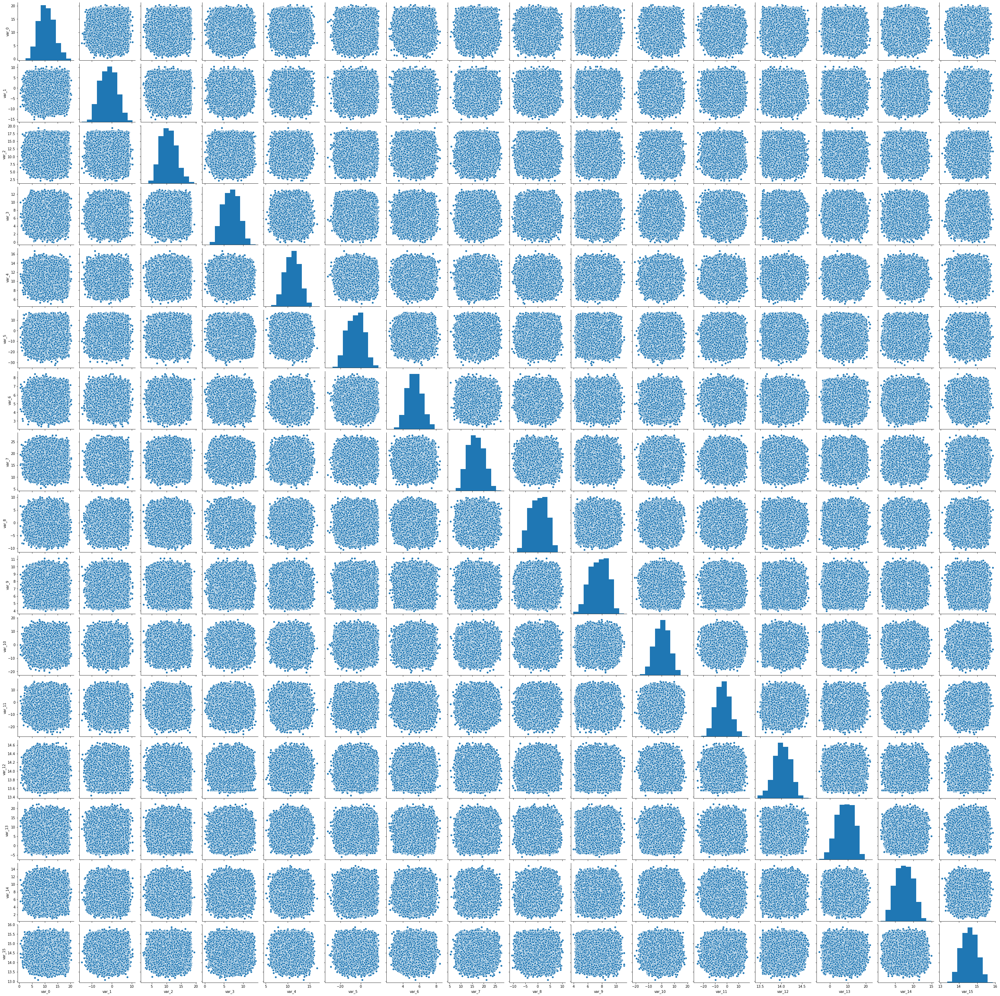

In [15]:
example_features = ['var_0', 'var_1','var_2','var_3', 'var_4', 'var_5', 'var_6', 'var_7', 
           'var_8', 'var_9', 'var_10','var_11','var_12', 'var_13', 'var_14', 'var_15', 
           ]

sns.pairplot(df_train[example_features])

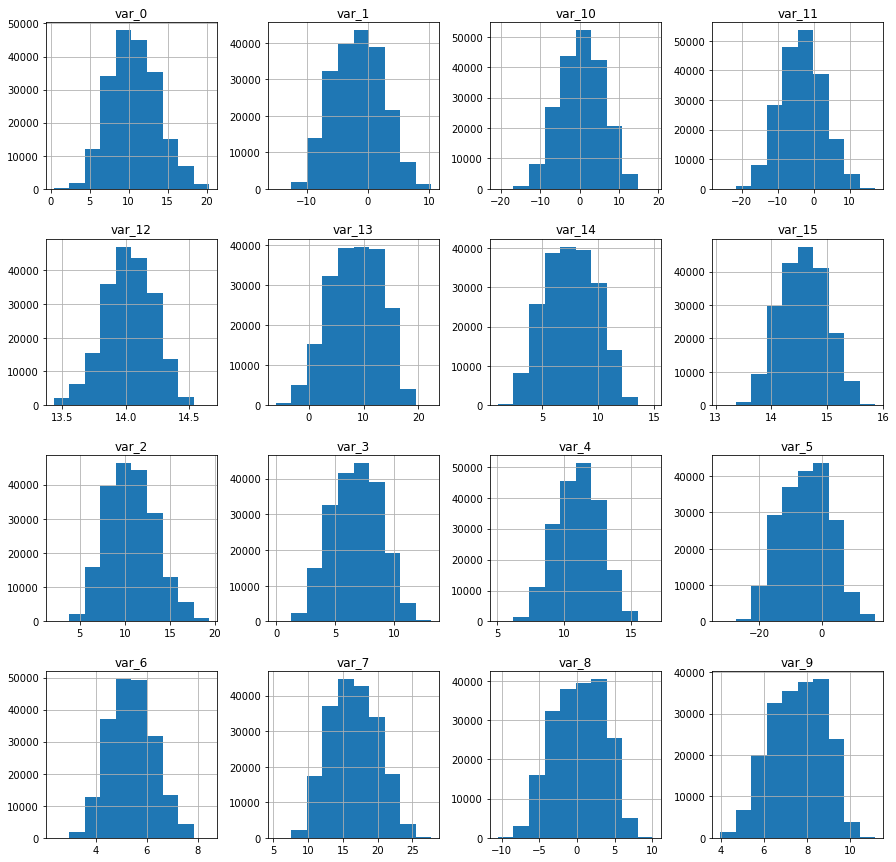

In [16]:
data_distribution = df_train[example_features].hist(figsize=(15,15))

The data apparently have a normal distribution

### Class balance

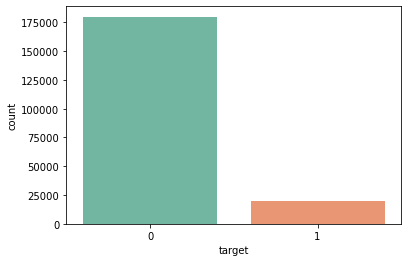

In [17]:
sns.countplot(df_train['target'], palette='Set2')

The dataset is unbalanced. Lets see the density plot of the variables in the dataset.

In [18]:
df_train_1 = df_train.columns.tolist()[0:103]
df_train_2 = df_train.columns.tolist()[103:]

<Figure size 432x288 with 0 Axes>

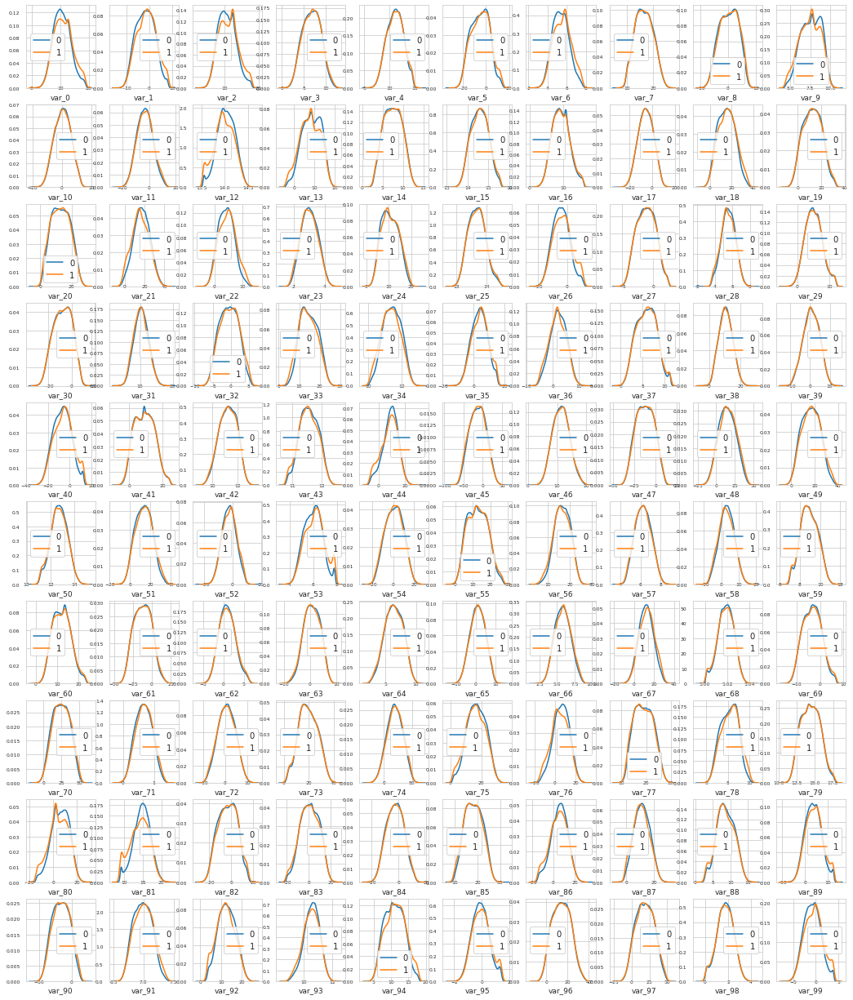

In [19]:
def plot_feature_distribution(df1, df2, label1, label2, features):
    i = 0
    sns.set_style('whitegrid')
    plt.figure()
    fig, ax = plt.subplots(10,10,figsize=(18,22))

    for feature in features:
        i += 1
        plt.subplot(10,10,i)
        sns.distplot(df1[feature], hist=False,label=label1)
        sns.distplot(df2[feature], hist=False,label=label2)
        plt.xlabel(feature, fontsize=9)
        locs, labels = plt.xticks()
        plt.tick_params(axis='x', which='major', labelsize=6, pad=-6)
        plt.tick_params(axis='y', which='major', labelsize=6)
    plt.show();
    
t0 = df_train.loc[df_train['target'] == 0]
t1 = df_train.loc[df_train['target'] == 1]
features = df_train.columns.values[2:102]
plot_feature_distribution(t0, t1, '0', '1', features)

<Figure size 432x288 with 0 Axes>

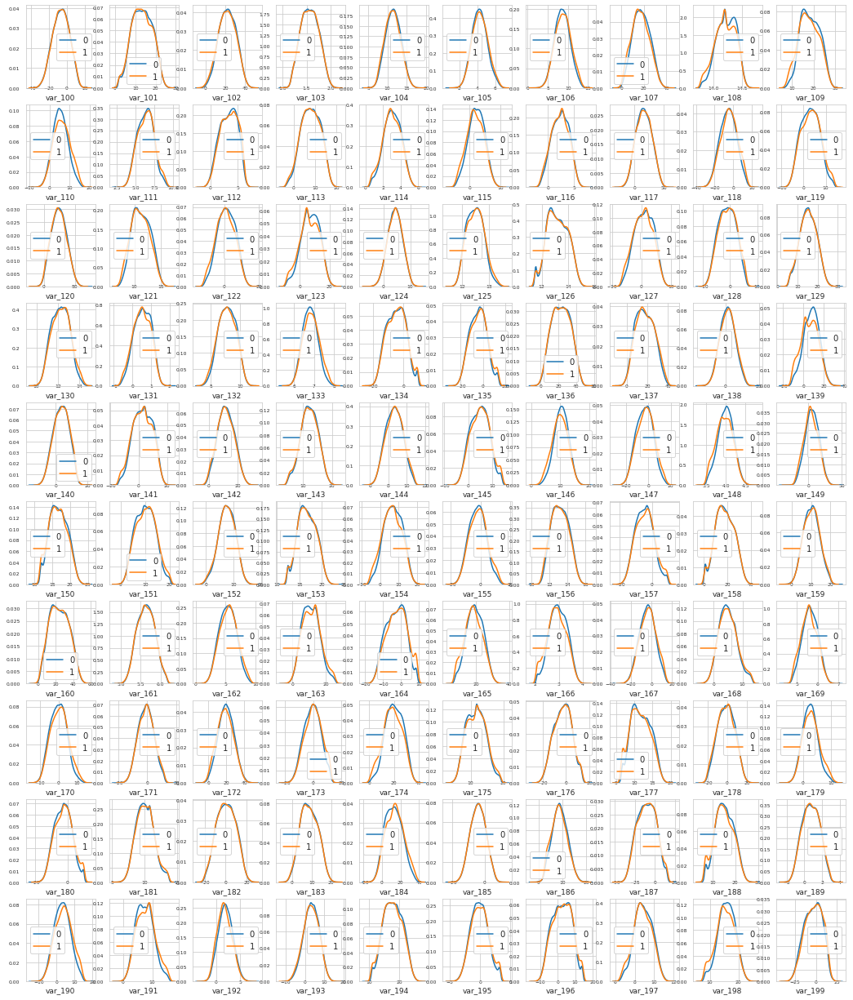

In [20]:
features = df_train.columns.values[102:202]
plot_feature_distribution(t0, t1, '0', '1', features)

Some features like var_0,var_1,var_2,var_12,var_13,var_110,var_166... have a different distribution for the target classes.

### Distribution of mean, std, max, min in the train and test set

#### Mean

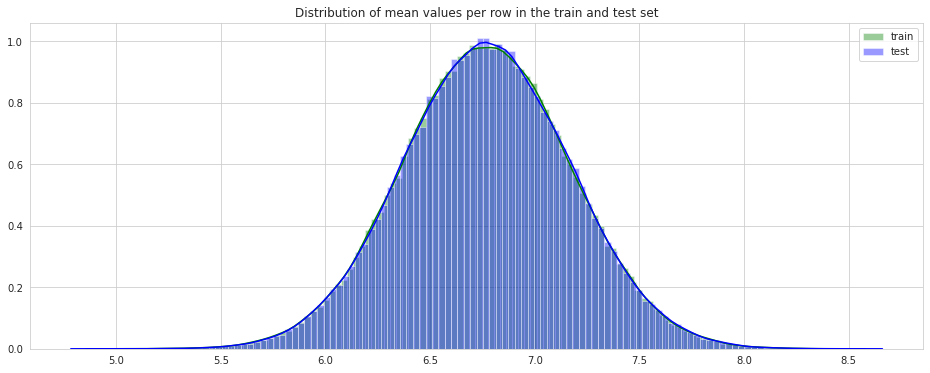

In [21]:
plt.figure(figsize=(16,6))
features = df_train.columns.values[2:]
plt.title("Distribution of mean values per row in the train and test set")
sns.distplot(df_train[features].mean(axis=1),color="green", kde=True,bins=120, label='train')
sns.distplot(df_test[features].mean(axis=1),color="blue", kde=True,bins=120, label='test')
plt.legend()
plt.show()

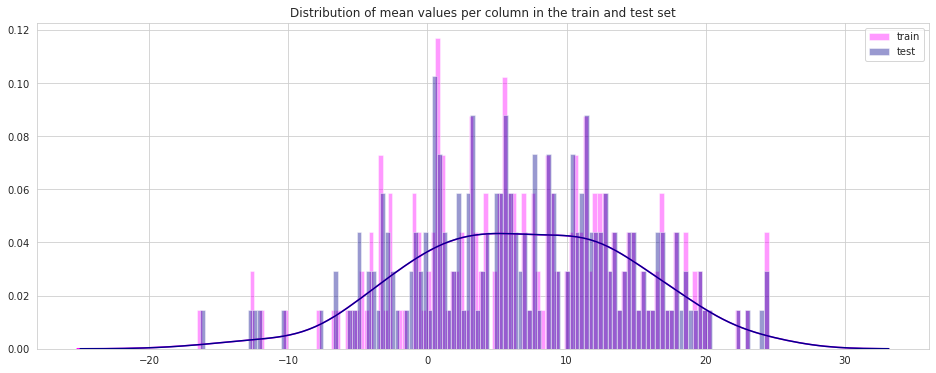

In [22]:
plt.figure(figsize=(16,6))
plt.title("Distribution of mean values per column in the train and test set")
sns.distplot(df_train[features].mean(axis=0),color="magenta",kde=True,bins=120, label='train')
sns.distplot(df_test[features].mean(axis=0),color="darkblue", kde=True,bins=120, label='test')
plt.legend()
plt.show()

#### Standard Deviation

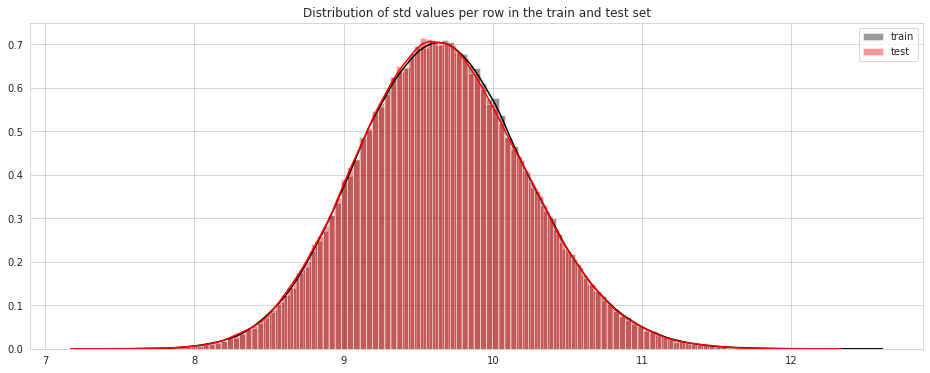

In [23]:
plt.figure(figsize=(16,6))
plt.title("Distribution of std values per row in the train and test set")
sns.distplot(df_train[features].std(axis=1),color="black", kde=True,bins=120, label='train')
sns.distplot(df_test[features].std(axis=1),color="red", kde=True,bins=120, label='test')
plt.legend();plt.show()

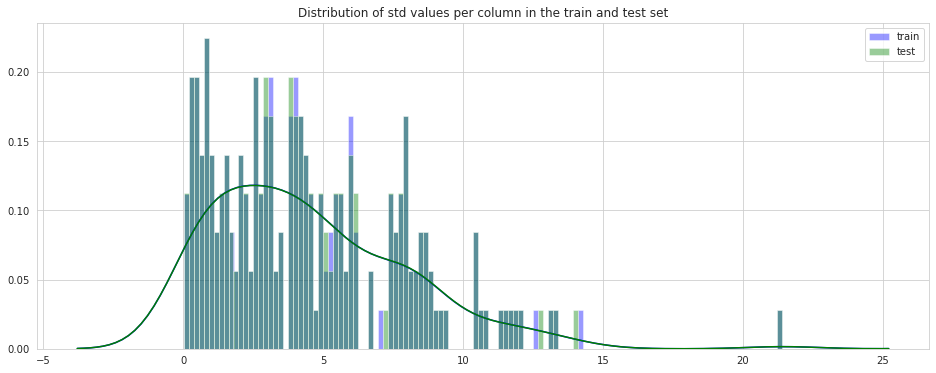

In [24]:
plt.figure(figsize=(16,6))
plt.title("Distribution of std values per column in the train and test set")
sns.distplot(df_train[features].std(axis=0),color="blue",kde=True,bins=120, label='train')
sns.distplot(df_test[features].std(axis=0),color="green", kde=True,bins=120, label='test')
plt.legend(); plt.show()

#### Min

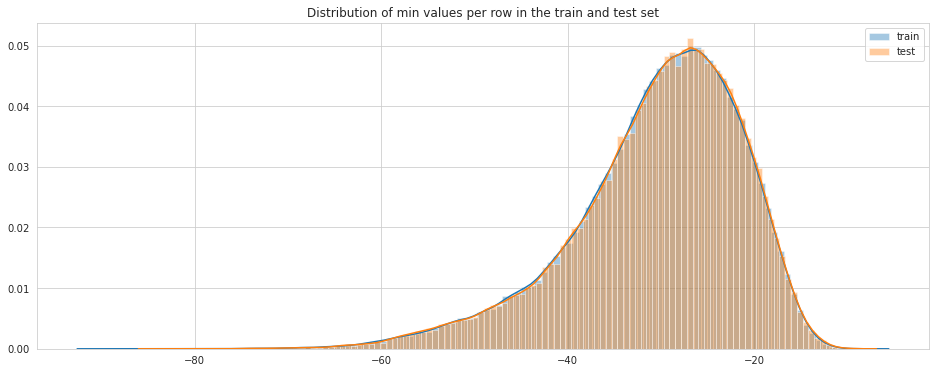

In [25]:
plt.figure(figsize=(16,6))
features = df_train.columns.values[2:]
plt.title("Distribution of min values per row in the train and test set")
sns.distplot(df_train[features].min(axis=1), kde=True,bins=120, label='train')
sns.distplot(df_test[features].min(axis=1), kde=True,bins=120, label='test')
plt.legend()
plt.show()

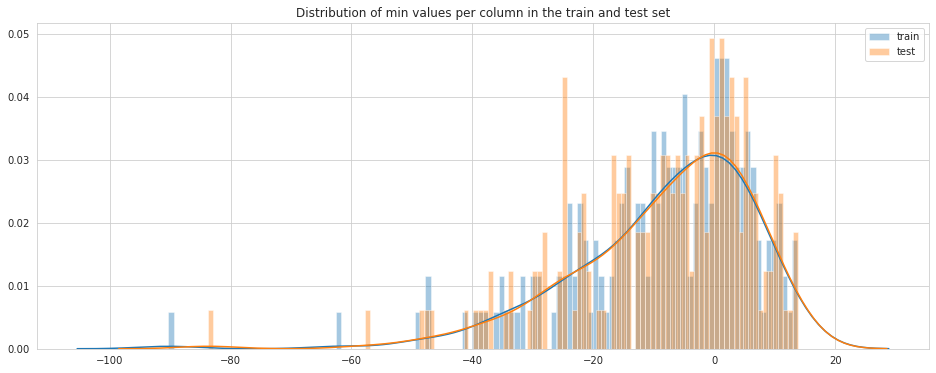

In [26]:
plt.figure(figsize=(16,6))
features = df_train.columns.values[2:202]
plt.title("Distribution of min values per column in the train and test set")
sns.distplot(df_train[features].min(axis=0), kde=True,bins=120, label='train')
sns.distplot(df_test[features].min(axis=0), kde=True,bins=120, label='test')
plt.legend()
plt.show()

#### Max

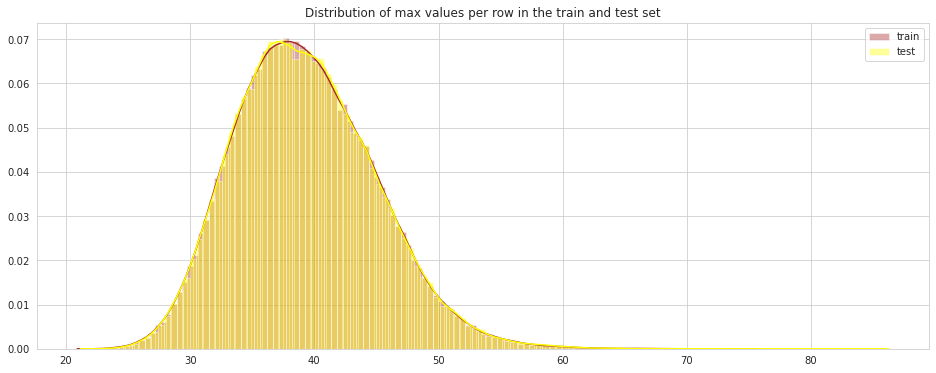

In [27]:
plt.figure(figsize=(16,6))
features = df_train.columns.values[2:]
plt.title("Distribution of max values per row in the train and test set")
sns.distplot(df_train[features].max(axis=1),color="brown", kde=True,bins=120, label='train')
sns.distplot(df_test[features].max(axis=1),color="yellow", kde=True,bins=120, label='test')
plt.legend()
plt.show()

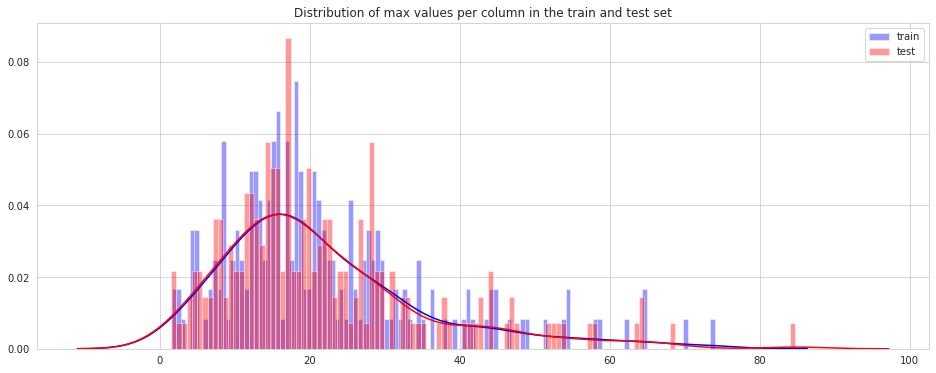

In [28]:
plt.figure(figsize=(16,6))
features = df_train.columns.values[2:202]
plt.title("Distribution of max values per column in the train and test set")
sns.distplot(df_train[features].max(axis=0),color="blue", kde=True,bins=120, label='train')
sns.distplot(df_test[features].max(axis=0),color="red", kde=True,bins=120, label='test')
plt.legend()
plt.show()

### Distribution of mean in the train set

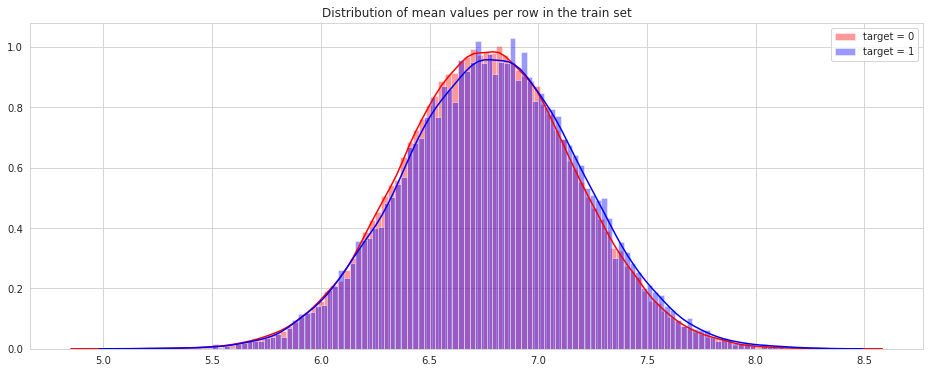

In [29]:
t0 = df_train.loc[df_train['target'] == 0]
t1 = df_train.loc[df_train['target'] == 1]
plt.figure(figsize=(16,6))
plt.title("Distribution of mean values per row in the train set")
sns.distplot(t0[features].mean(axis=1),color="red", kde=True,bins=120, label='target = 0')
sns.distplot(t1[features].mean(axis=1),color="blue", kde=True,bins=120, label='target = 1')
plt.legend(); plt.show()

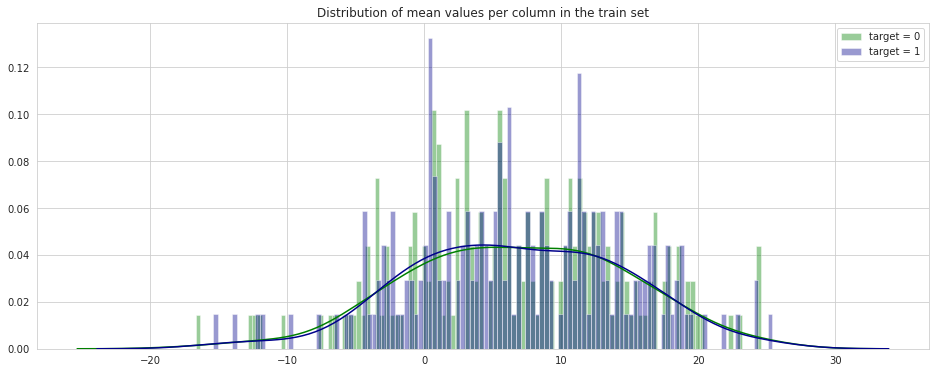

In [30]:
plt.figure(figsize=(16,6))
plt.title("Distribution of mean values per column in the train set")
sns.distplot(t0[features].mean(axis=0),color="green", kde=True,bins=120, label='target = 0')
sns.distplot(t1[features].mean(axis=0),color="darkblue", kde=True,bins=120, label='target = 1')
plt.legend(); plt.show()

### Correlation matrix

We can take some random features to see if there is a significant correlation between them.

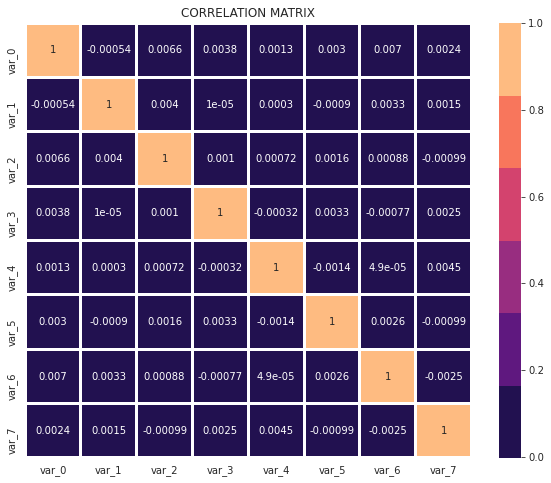

In [31]:
plt.figure(figsize=(10,8))
sns.heatmap(df_train[df_train.columns.tolist()[2:10]].corr(),annot=True,cmap=sns.color_palette("magma"),linewidth=2,edgecolor="k")

plt.title("CORRELATION MATRIX")
plt.show()

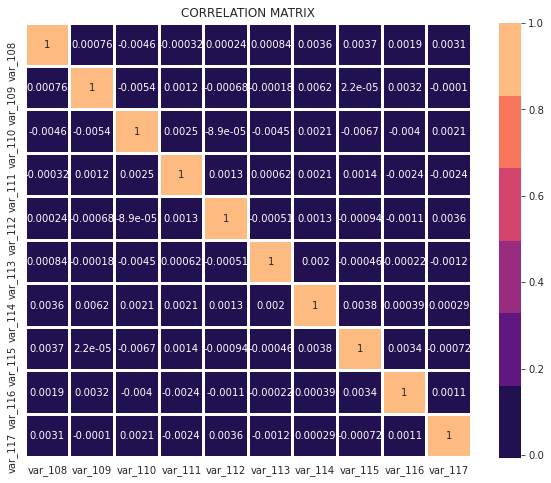

In [32]:
plt.figure(figsize=(10,8))
sns.heatmap(df_train[df_train.columns.tolist()[110:120]].corr(),annot=True,cmap=sns.color_palette("magma"),linewidth=2,edgecolor="k")

plt.title("CORRELATION MATRIX")
plt.show()

Apparently there is no significant correlation betweem variables. We can obtain the top correlated features to see it more clearly.

In [33]:
features = df_train.columns.values[2:]
correlations = df_train[features].corr().abs().unstack().sort_values(kind="quicksort").reset_index()
correlations = correlations[correlations['level_0'] != correlations['level_1']]

In [34]:
#Top 10 correlated features
correlations.tail(10)

,level_0,level_1,0
39790,var_183,var_189,0.009359
39791,var_189,var_183,0.009359
39792,var_174,var_81,0.009490
39793,var_81,var_174,0.009490
39794,var_81,var_165,0.009714
39795,var_165,var_81,0.009714
39796,var_53,var_148,0.009788
39797,var_148,var_53,0.009788
39798,var_26,var_139,0.009844
39799,var_139,var_26,0.009844


In [35]:
#Top 10 least correlated features
correlations.head(10)

,level_0,level_1,0
0,var_75,var_191,2.703975e-08
1,var_191,var_75,2.703975e-08
2,var_173,var_6,5.942735e-08
3,var_6,var_173,5.942735e-08
4,var_126,var_109,1.313947e-07
5,var_109,var_126,1.313947e-07
6,var_144,var_27,1.772502e-07
7,var_27,var_144,1.772502e-07
8,var_177,var_100,3.116544e-07
9,var_100,var_177,3.116544e-07


## PCA

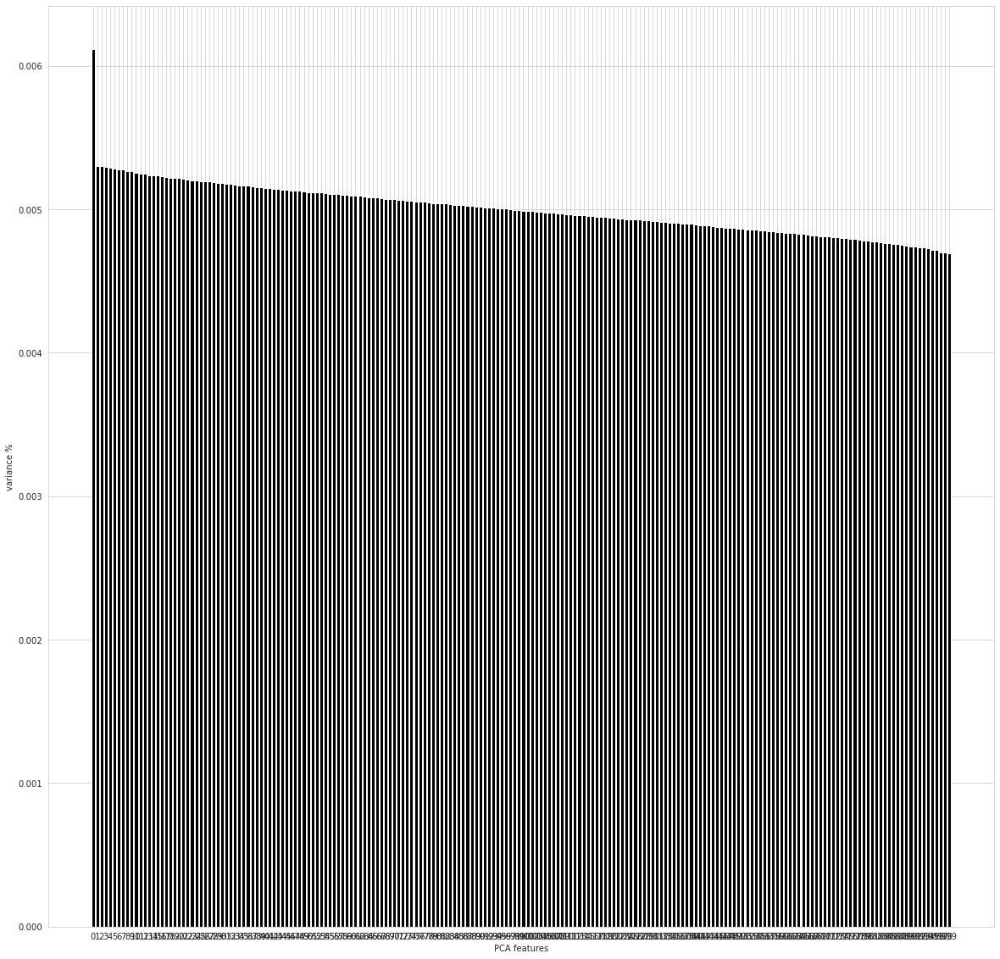

In [36]:
# Standardize the data to have a mean of ~0 and a variance of 1
X = StandardScaler().fit_transform(df_train.iloc[:,2:])

# Create a PCA instance: pca
pca = PCA(n_components=200)
principalComponents = pca.fit_transform(X)

# Plot the explained variances
features = range(pca.n_components_)
plt.figure(figsize=(20,20))
plt.bar(features, pca.explained_variance_ratio_, color='black')
plt.xlabel('PCA features')
plt.ylabel('variance %')
plt.xticks(features)

# Save components to a DataFrame
PCA_components = pd.DataFrame(principalComponents)

Text(0, 0.5, 'PCA 2')

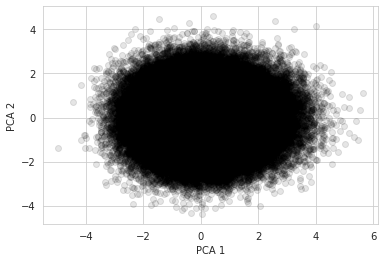

In [37]:
colors = itertools.cycle(["r", "b", "g"])

plt.scatter(PCA_components[0], PCA_components[1], alpha=.1, color=['black'])
plt.xlabel('PCA 1')
plt.ylabel('PCA 2')

Apparently we can see two clusters: all centered points and the disperse outboundaries points. And we know there are two true clusters because target feature.

## Clustering

First, although we know the number of clusters "k" is 2, we'll plot the possible values for k to get the elbow point.

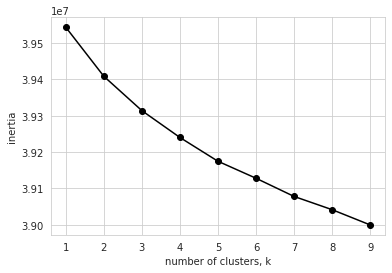

CPU times: user 38min 11s, sys: 13.9 s, total: 38min 25s
Wall time: 37min 43s


In [38]:
%%time

ks = range(1, 10)
inertias = []
for k in ks:
    # Create a KMeans instance with k clusters: model
    model = KMeans(n_clusters=k)
    
    # Fit model to samples
    model.fit(PCA_components.iloc[:,2:])
    
    # Append the inertia to the list of inertias
    inertias.append(model.inertia_)
    
plt.plot(ks, inertias, '-o', color='black')
plt.xlabel('number of clusters, k')
plt.ylabel('inertia')
plt.xticks(ks)
plt.show()

This plot show that the possible number of clusters is two, three, four. After that number the change in value of inertia and the variance of the data is no longer significant.

In [39]:
%%time

kmeans = KMeans(n_clusters=2, random_state=0).fit(X)

unique, counts = np.unique(kmeans.labels_, return_counts=True)

print('Actual clusters/Target feature')
print(df_train['target'].value_counts())
print('Percentages: class 0: '+ str(df_train['target'].value_counts()[0]/len(df_train))+' class 1: '+ str(df_train['target'].value_counts()[1]/len(df_train)))
print('************************')
print('Two clusters')
print (np.asarray((unique, counts)).T) 
print('Percentages: class 0: '+ str(np.asarray((unique, counts)).T[1][1]/len(df_train))+' class 1: '+ str(np.asarray((unique, counts)).T[0][1]/len(df_train)))

Actual clusters/Target feature
0    179902
1     20098
Name: target, dtype: int64
Percentages: class 0: 0.89951 class 1: 0.10049
************************
Two clusters
[[     0  91704]
 [     1 108296]]
Percentages: class 0: 0.54148 class 1: 0.45852
CPU times: user 1min 1s, sys: 1.46 s, total: 1min 3s
Wall time: 1min


ARI = 0.053854547319851696


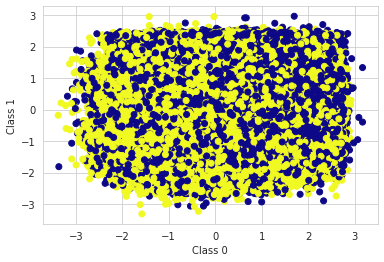

In [40]:
y_pred = kmeans.predict(X)
y = np.asarray(df_train['target'])

# plot the cluster assignments and cluster centers
plt.scatter(X[:, 0], X[:, 1], c=y_pred, cmap="plasma")
plt.scatter(kmeans.cluster_centers_[:, 0],   
            kmeans.cluster_centers_[:, 1],
            marker='^', 
            c=[0, 1], 
            s=100, 
            linewidth=2,
            cmap="plasma")
plt.xlabel("Class 0")
plt.ylabel("Class 1")

#k-means performance:
print("ARI =", adjusted_rand_score(y, y_pred))

There clustering is not good. It fails because kmeans tries to find cluster centers that are representative of certain regions of the data, and in this data the second cluster is spread around the first one: it is not linearly separable.

But we can transform to higher dimensional representation that make the data linearly separable or we can treat the data points as graph-nodes to solve a graph-partitioning problem.

We can use sklearn SpectralClustering to solve the graph-partitioning problem. More info in: https://www.geeksforgeeks.org/ml-spectral-clustering/. 

The code below is only an example because the computing time with all the data involved (200000 values with 200 features) is too high for this kind of clusteringa and requires good cloud computing.




In [41]:
# We use a sample because the notebook crashes if we use all data (200000) because high computation

df_train_sample = df_train.sample(n=1000)
df_train_sample_nt = df_train_sample.iloc[:,2:]
X_sample = StandardScaler().fit_transform(df_train_sample_nt)

In [42]:
%%time

clustering = SpectralClustering(n_clusters=2, affinity="rbf", random_state=0).fit(X_sample)

unique, counts = np.unique(clustering.labels_, return_counts=True)

print('Actual clusters/Target feature')
print(df_train_sample['target'].value_counts())
print('Percentages: class 0: '+ str(df_train_sample['target'].value_counts()[0]/len(df_train_sample))+' class 1: '+ str(df_train_sample['target'].value_counts()[1]/len(df_train_sample)))
print('************************')
print('Two clusters')
print (np.asarray((unique, counts)).T) 
print('Percentages: class 0: '+ str(np.asarray((unique, counts)).T[1][1]/len(df_train_sample))+' class 1: '+ str(np.asarray((unique, counts)).T[0][1]/len(df_train_sample)))

Actual clusters/Target feature
0    918
1     82
Name: target, dtype: int64
Percentages: class 0: 0.918 class 1: 0.082
************************
Two clusters
[[  0 999]
 [  1   1]]
Percentages: class 0: 0.001 class 1: 0.999
CPU times: user 2min 12s, sys: 1.89 s, total: 2min 14s
Wall time: 1min 7s


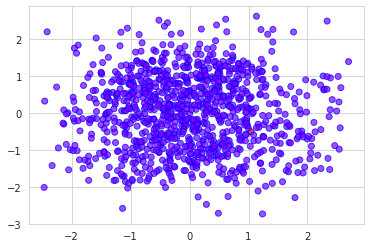

In [43]:
plt.scatter(X_sample[:,0], X_sample[:,1], c=clustering.labels_, cmap='rainbow', alpha=0.7, edgecolors='b')

## Classification

For a preliminar aproximation, a pipeline could be used for a classification algorithm comparison.

* A sample of the train dataset will be used due to down-sampling the mayority class and due to computation time.

* The evaluation metric

#### Down-sampling the mayority class

In [44]:
df_final = df_train.sample(n = 100000, random_state = 101)

In [45]:
df_final['target'].value_counts()

0    89955
1    10045
Name: target, dtype: int64

In [46]:
df_majority = df_final[df_final.target==0]
df_minority = df_final[df_final.target==1]

df_majority_downsampled = resample(df_majority, 
                                 replace=False,    # sample without replacement
                                 n_samples=df_final['target'].value_counts()[1],     # to match minority class
                                 random_state=101) # reproducible results

df_downsampled = pd.concat([df_majority_downsampled, df_minority])

df_downsampled.target.value_counts()

1    10045
0    10045
Name: target, dtype: int64

#### Train and test dataset (this is only done because we took our sample dataset as the only one. We originally have a train and a test set).

In [47]:
df_final = df_downsampled.copy()
X = preprocessing.normalize(df_final.iloc[:,2:], axis=1)
y = df_final['target'].values

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=.20, random_state=101)
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=.15, random_state=101)

LogReg: 0.862764 (+/- 0.001566)
KNN: 0.622624 (+/- 0.008045)
DecisionTreeClassifier: 0.575202 (+/- 0.003362)
RandomForestClassifier: 0.822552 (+/- 0.004747)
AdaBoostClassifier: 0.822552 (+/- 0.004747)
XGBClassifier: 0.843392 (+/- 0.004129)
ExtraTreesClassifier: 0.788526 (+/- 0.005284)
GradientBoostingClassifier: 0.843417 (+/- 0.005410)
RidgeClassifier: 0.863151 (+/- 0.001410)
BaggingRidgeClassifier: 0.690566 (+/- 0.011400)


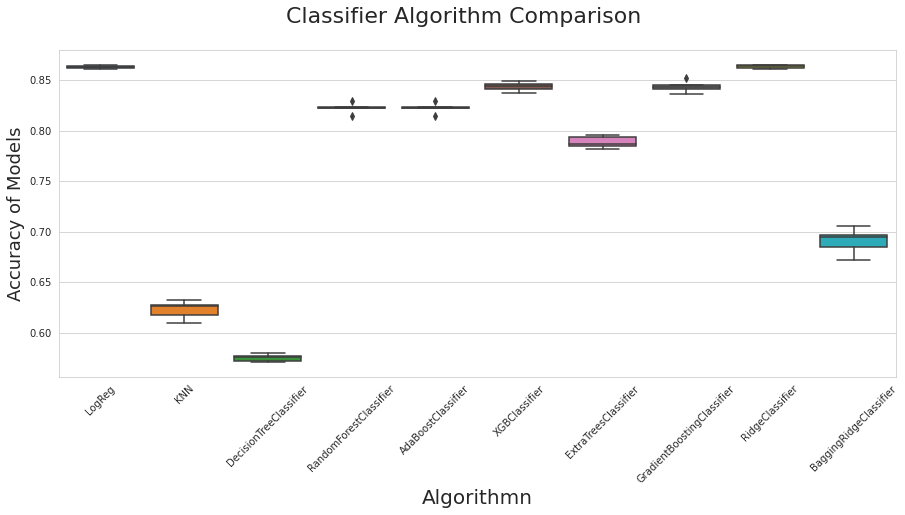

CPU times: user 779 ms, sys: 522 ms, total: 1.3 s
Wall time: 13min 45s


In [48]:
%%time

warnings.filterwarnings("ignore")

clfs = []
seed = 101

clfs.append(("LogReg", 
             Pipeline([("Scaler", StandardScaler()), # Standardize features by removing the mean and scaling to unit variance
                       ("LogReg", LogisticRegression(n_jobs=-1, random_state=101))]))) 
            #Pipeline(steps(list))
                        #n_jobs: Number of CPU cores used when parallelizing over classes if multi_class=’ovr’”
                        #        -1 means using all processors
clfs.append(("KNN", 
             Pipeline([("Scaler", StandardScaler()),
                      ("KNN", KNeighborsClassifier(n_jobs=-1))]))) 

clfs.append(("DecisionTreeClassifier", 
             Pipeline([("Scaler", StandardScaler()),
                       ("DecisionTrees", DecisionTreeClassifier(random_state=101))]))) 

clfs.append(("RandomForestClassifier", 
             Pipeline([("Scaler", StandardScaler()),
                       ("RandomForest", RandomForestClassifier(n_estimators=200, n_jobs=-1, 
                                                               random_state=101))]))) 
clfs.append(("AdaBoostClassifier", 
             Pipeline([("Scaler", StandardScaler()),
                       ("RandomForest", RandomForestClassifier(n_estimators=200, n_jobs=-1, 
                                                               random_state=101))])))

clfs.append(("XGBClassifier",
             Pipeline([("Scaler", StandardScaler()),
                       ("XGB", XGBClassifier(n_estimators=200, n_jobs=-1, random_state=101))]))) 

clfs.append(("ExtraTreesClassifier",
             Pipeline([("Scaler", StandardScaler()),
                       ("ExtraTrees", ExtraTreesClassifier(n_jobs=-1, random_state=101))])))


clfs.append(("GradientBoostingClassifier", 
             Pipeline([("Scaler", StandardScaler()),
                       ("GradientBoosting", GradientBoostingClassifier(n_estimators=200,
                                                                       random_state=101))]))) 
clfs.append(("RidgeClassifier", 
             Pipeline([("Scaler", StandardScaler()),
                       ("RidgeClassifier", RidgeClassifier(random_state=101))])))

clfs.append(("BaggingRidgeClassifier",
             Pipeline([("Scaler", StandardScaler()),
                       ("BaggingClassifier", BaggingClassifier(n_jobs=-1, random_state=101))])))


#'neg_mean_absolute_error', 'neg_mean_squared_error','r2'
scoring = 'roc_auc'
n_folds = 5

results, names  = [], [] 

#Kfold-validation
for name, model  in clfs:
    kfold = KFold(n_splits=n_folds, random_state=seed)
    cv_results = cross_val_score(model, X_train, y_train, 
                                 cv= n_folds, scoring=scoring,
                                 n_jobs=-1)    
    names.append(name)
    results.append(cv_results)    
    msg = "%s: %f (+/- %f)" % (name, cv_results.mean(),  cv_results.std())
    print(msg)
    
# boxplot algorithm comparison
fig = plt.figure(figsize=(15,6))
fig.suptitle('Classifier Algorithm Comparison', fontsize=22)
ax = fig.add_subplot(111)
sns.set_style("dark")
sns.boxplot(x=names, y=results)
ax.set_xticklabels(names)
ax.set_xlabel("Algorithmn", fontsize=20)
ax.set_ylabel("Accuracy of Models", fontsize=18)
ax.set_xticklabels(ax.get_xticklabels(),rotation=45)
plt.show()

It looks like the RidgeClassifier algorithm have the best accuracy although the mediam is closer to the top of the box: a "Negatively Skewed" distribution (when mean < median. It means the data constitute higher frequency of low valued scores.)

A extensive analysis could be made with each algorithm (using all data, hyperparameter tunning, etc.) but for explanation and learning purposes we'll classificate with the RidgeClassifier in more depth.

In [49]:
df_final = df_train.copy()
X = preprocessing.normalize(df_final.iloc[:,2:], axis=1)
y = df_final['target'].values

roc_auc accuracy: 0.8568086854830842,std: 0.0027741333155325344
Classification Report : 
              precision    recall  f1-score   support

           0       0.90      1.00      0.95    179902
           1       0.94      0.02      0.04     20098

    accuracy                           0.90    200000
   macro avg       0.92      0.51      0.49    200000
weighted avg       0.91      0.90      0.86    200000

CPU times: user 1.88 s, sys: 1.09 s, total: 2.97 s
Wall time: 15 s


Text(0.5, 1.0, 'CONFUSION MATRIX')

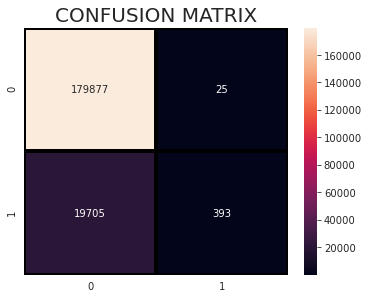

In [50]:
%%time 

rc_clf = RidgeClassifier()
rc_clf.fit(X, y) 
    
#scoring='roc_auc'
# n_jobs=-1
scores = cross_val_score(rc_clf, X, y, cv=10, scoring = 'roc_auc',  n_jobs=-1)

print('roc_auc accuracy: ' + str(scores.mean()) +  ',std: ' + str(scores.std()))
    
y_test = y.copy()
y_pred = cross_val_predict(rc_clf,X,y,cv=10, n_jobs=-1)

print('Classification Report : ')
print (classification_report(y_test, y_pred))

#Confusion matrix
plt.figure(figsize=(13,10))
plt.subplot(221)
sns.heatmap(confusion_matrix(y_test,y_pred),annot=True,fmt = "d",linecolor="k",linewidths=3)
plt.title("CONFUSION MATRIX",fontsize=20)

#### GridSearch: hyperparmeter tunning

In [51]:
%%time

params = {
        'solver': ['auto' , 'svd', 'lsqr','saga'],
        'max_iter': [10,20,None],
        'random_state': [101]
        }


grid_solver = GridSearchCV(estimator = rc_clf, # model to train
                   param_grid = params, # param_grid
                   scoring = 'roc_auc',
                   cv = 10)
model_result = grid_solver.fit(X,y)

CPU times: user 7min 53s, sys: 48.6 s, total: 8min 41s
Wall time: 7min 6s


In [52]:
model_result.best_estimator_

RidgeClassifier(alpha=1.0, class_weight=None, copy_X=True, fit_intercept=True,
                max_iter=10, normalize=False, random_state=101, solver='saga',
                tol=0.001)

In [53]:
model_result.best_score_

0.8568131624638745

In [54]:
model_result.best_params_

{'max_iter': 10, 'random_state': 101, 'solver': 'saga'}

#### **Final model**

roc_auc accuracy: 0.8568131624638745,std: 0.0027767970561563353
Classification Report : 
              precision    recall  f1-score   support

           0       0.90      1.00      0.95    179902
           1       0.94      0.02      0.04     20098

    accuracy                           0.90    200000
   macro avg       0.92      0.51      0.49    200000
weighted avg       0.91      0.90      0.86    200000

CPU times: user 8.04 s, sys: 798 ms, total: 8.84 s
Wall time: 59.6 s


Text(0.5, 1.0, 'CONFUSION MATRIX')

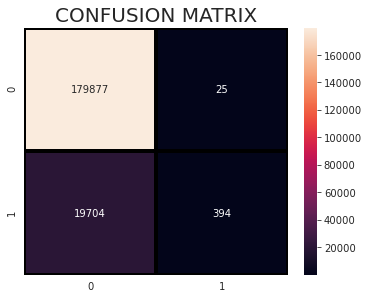

In [55]:
%%time 

rc_clf = RidgeClassifier(max_iter = 10, random_state= 101, solver= 'saga')
rc_clf.fit(X, y) 
    
scores = cross_val_score(rc_clf, X, y, cv=10, scoring = 'roc_auc',  n_jobs=-1)

print('roc_auc accuracy: ' + str(scores.mean()) +  ',std: ' + str(scores.std()))
    
y_test = y.copy()
y_pred = cross_val_predict(rc_clf,X,y,cv=10, n_jobs=-1)

print('Classification Report : ')
print (classification_report(y_test, y_pred))

#Confusion matrix
plt.figure(figsize=(13,10))
plt.subplot(221)
sns.heatmap(confusion_matrix(y_test,y_pred),annot=True,fmt = "d",linecolor="k",linewidths=3)
plt.title("CONFUSION MATRIX",fontsize=20)

The improvement is minimal but is a good practice to always tune the hyperparameters to find better scores.